# Object Tracking

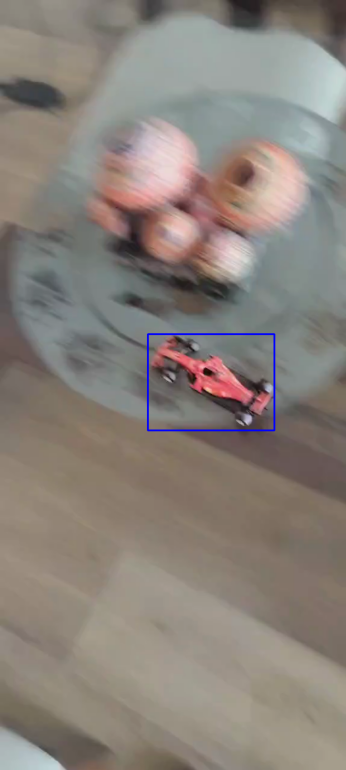

## Import the Libraries

In [19]:
import sys
import cv2
import matplotlib.pyplot as plt

from urllib.request import urlretrieve

from IPython.display import Video

%matplotlib inline

## Tracker Class in OpenCV

1. BOOSTING
- Use an ensemble of weak classifiers to iteratively learn the object's appearance. They adapt to gradual changes in the object's features, making them robust to small variations in shape, lighting, or occlusions.
- They are computationally expensive and slower compared to modern trackers like KCF or MOSSE, making them less suitable for real-time applications.
2. MIL (Multiple Instance Learning) :
- Learns from multiple patches around the object to improve robustness.
- Handles partial occlusions well but can be slower.
3. KCF (Kernelized Correlation Filters) :
- Uses correlation filters for fast tracking.
- Efficient and works well with simple motions but struggles with significant appearance changes.
4. CSRT (Channel and Spatial Reliability Tracker) :
- Focuses on accurate localization by analyzing spatial and color information.
- Slower but highly precise, especially for objects with complex motion.
5. TLD (Tracking, Learning, and Detection) :
- Combines tracking, learning, and detection to handle long-term tracking.
- Good for recovering lost objects but can be unstable at times.
6. MEDIANFLOW :
- Tracks forward and backward to estimate reliability and detect failures.
- Works well for predictable motions but struggles with large or erratic movements.
7. MOSSE (Minimum Output Sum of Squared Error) :
- Extremely fast and simple, using adaptive correlation filters.
- Less accurate but great for real-time applications.

In [20]:
video_input_file_name = "datos/ObjectTracking/formula_1.mp4"


def drawRectangle(frame, bbox):
    p1 = (int(bbox[0]), int(bbox[1]))
    p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
    cv2.rectangle(frame, p1, p2, (255, 0, 0), 2, 1)


def displayRectangle(frame, bbox):
    plt.figure(figsize=(20, 10))
    frameCopy = frame.copy()
    drawRectangle(frameCopy, bbox)
    frameCopy = cv2.cvtColor(frameCopy, cv2.COLOR_RGB2BGR)
    plt.imshow(frameCopy)
    plt.axis("off")
    plt.savefig('datos/ObjectTracking/Saved/frame.png', bbox_inches='tight', pad_inches=0)


def drawText(frame, txt, location, color=(50, 170, 50)):
    cv2.putText(frame, txt, location, cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

## Create the tracker instance

In [21]:
tracker_type = "BOOSTING"

tracker = cv2.legacy.TrackerBoosting.create()

## Read input video and setup output video

In [22]:
# Read video
video = cv2.VideoCapture(video_input_file_name)
ok, frame = video.read()

# Exit if video not opened
if not video.isOpened():
    print("Could not open video")
    sys.exit()
else:
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_output_file_name = "datos/ObjectTracking/Saved/formula_1-" + tracker_type + ".mp4"
video_out = cv2.VideoWriter(video_output_file_name, cv2.VideoWriter_fourcc(*'avc1'), 10, (width, height))

video_output_file_name

'datos/ObjectTracking/Saved/formula_1-BOOSTING.mp4'

## Define bounding box

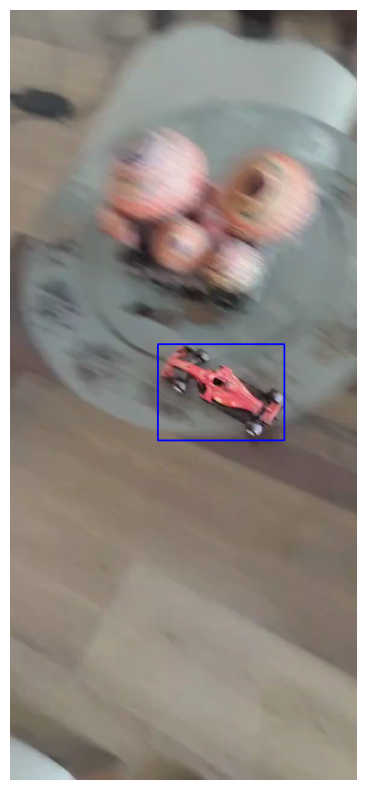

In [23]:
# Define a bounding box
bbox = (245, 555 , 210, 160)
displayRectangle(frame, bbox)

## Intilialize Tracker

1. One frame
2. A bounding box

In [24]:
# Initialize tracker with first frame and bounding box
ok = tracker.init(frame, bbox)

## Read frame and Track Object

In [25]:
while True:
    ok, frame = video.read()

    if not ok:
        break

    # Start timer
    timer = cv2.getTickCount()

    # Update tracker
    ok, bbox = tracker.update(frame)

    # Calculate Frames per second (FPS)
    fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)

    # Draw bounding box
    if ok:
        drawRectangle(frame, bbox)
    else:
        drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

    # Display Info
    drawText(frame, tracker_type + " Tracker", (80, 60))
    drawText(frame, "FPS : " + str(int(fps)), (80, 100))

    # Write frame to video
    video_out.write(frame)

video.release()
video_out.release()

## Use other trackers

In [26]:
tracker_types = [
    "MIL",
    "KCF",
    "CSRT",
    "TLD",
    "MEDIANFLOW",
    "MOSSE",
]

for tracker_type in tracker_types:

    if tracker_type == "MIL":
        tracker = cv2.legacy.TrackerMIL.create()
    elif tracker_type == "KCF":
        tracker = cv2.TrackerKCF.create()
    elif tracker_type == "CSRT":
        tracker = cv2.TrackerCSRT.create()
    elif tracker_type == "TLD":
        tracker = cv2.legacy.TrackerTLD.create()
    elif tracker_type == "MEDIANFLOW":
        tracker = cv2.legacy.TrackerMedianFlow.create()
    else:
        tracker = cv2.legacy.TrackerMOSSE.create()

    video = cv2.VideoCapture(video_input_file_name)
    ok, frame = video.read()

    # Exit if video not opened
    if not video.isOpened():
        print("Could not open video")
        sys.exit()
    else:
        width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    video_output_file_name = "datos/ObjectTracking/Saved/formula_1-" + tracker_type + ".mp4"
    video_out = cv2.VideoWriter(video_output_file_name, cv2.VideoWriter_fourcc(*'avc1'), 10, (width, height))

    # Define a bounding box
    bbox = (245, 555 , 210, 160)

    # Initialize tracker with first frame and bounding box
    ok = tracker.init(frame, bbox)

    while True:
        ok, frame = video.read()

        if not ok:
            break

        # Start timer
        timer = cv2.getTickCount()

        # Update tracker
        ok, bbox = tracker.update(frame)

        # Calculate Frames per second (FPS)
        fps = cv2.getTickFrequency() / (cv2.getTickCount() - timer)

        # Draw bounding box
        if ok:
            drawRectangle(frame, bbox)
        else:
            drawText(frame, "Tracking failure detected", (80, 140), (0, 0, 255))

        # Display Info
        drawText(frame, tracker_type + " Tracker", (80, 60))
        drawText(frame, "FPS : " + str(int(fps)), (80, 100))

        # Write frame to video
        video_out.write(frame)

    video.release()
    video_out.release()

## GOTURN tracker

Download the goturn.caffemodel

In [27]:
import requests
import os

output = "goturn.caffemodel"

if os.path.exists(output):
    print(f"File exists: {output}")
else:
    url = "https://www.dropbox.com/scl/fi/oeih7d4r9iyolp3vaa13f/goturn.caffemodel?rlkey=uudcbrtxj6xe6r0jc7ctyhpwy&st=r5uozyir&dl=1"

    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))

    downloaded_size = 0
    with open(output, 'wb') as file:
        for data in response.iter_content(chunk_size=1024):
            downloaded_size += len(data)
            file.write(data)
            # Mostrar el progreso
            print(f"Downloading: {downloaded_size / 1024 / 1024:.2f} MB / {total_size / 1024 / 1024:.2f} MB", end='\r')

    print(f"\nFile Downloaded as {output}")

File exists: goturn.caffemodel


**For the generation of the video with the use of GOTURN Tracker run the GOTURNTracker.py script**

## Display Video with Boosting tracker

In [28]:
video_path = 'datos/ObjectTracking/Saved/formula_1-BOOSTING.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with CSRT tracker

In [29]:
video_path = 'datos/ObjectTracking/Saved/formula_1-CSRT.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with KCF tracker

In [30]:
video_path = 'datos/ObjectTracking/Saved/formula_1-KCF.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with MEDIANFLOW tracker

In [31]:
video_path = 'datos/ObjectTracking/Saved/formula_1-MEDIANFLOW.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with MIL tracker

In [32]:
video_path = 'datos/ObjectTracking/Saved/formula_1-MIL.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with MOSSE tracker

In [33]:
video_path = 'datos/ObjectTracking/Saved/formula_1-MOSSE.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with TLD tracker

In [34]:
video_path = 'datos/ObjectTracking/Saved/formula_1-TLD.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Display Video with GOTURN tracker

In [35]:
video_path = 'datos/ObjectTracking/Saved/formula_1-GOTURN.mp4'

# Show the video in the notebook
video = Video(video_path, width=700, height=438, embed=True)
display(video)

## Why the GOTURN tracker fails?

1. Pretrained Model Mismatch
- GOTURN's pretrained model is likely trained on real-world objects (e.g., cars, people, animals) at normal scales.
- A toy car is much smaller and may not match the features the model expects, leading to inaccurate tracking.
2. Small Size of the Object
- Toy cars are small, so their bounding box covers fewer pixels in the frame.
- GOTURN may struggle to track small objects because there isn't enough detail for the model to lock onto.
3. Irregular Motion
- If the toy car moves erratically (e.g., sudden stops, turns, or shaking), GOTURN might lose track because it expects smoother motion patterns.
4. Background Clutter
- If the toy car is placed in an environment with complex or cluttered backgrounds (e.g., household objects, textures, or shadows), the tracker might confuse the background with the car.
5. Lighting and Reflections
- Toy cars often have shiny surfaces that can reflect light or create glare. These lighting changes can confuse GOTURN and cause it to lose the object.
6. Initial Bounding Box
- If the initial bounding box is too large or includes parts of the background (e.g., the floor or nearby objects), GOTURN might focus on the wrong features and fail to track the toy car accurately.